In [203]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from panns_inference import AudioTagging, SoundEventDetection, labels
import librosa
import seaborn as sns
from sklearn.cluster import KMeans
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler

from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

In [204]:
# GET PANNS EVENTS EMBEDDINGS, ACCUMULATE THE EMBEDDINGS TO GET AN EVENT LEVEL REPR. OF AUDIO AND 
# THEN USE TSNE TO CLUSTER.

In [205]:
encoder_df = pd.read_pickle("/work/aistwal/MMDS_MasterThesis/data/tau2019/tau2019_encoder_data/tau_2019_conv_autoencoder_50_10.pkl")

In [206]:
encoder_df.head()

,Audio_Name,Label,Encoder Output
0,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,airport,"[979.00555, 1315.8931, 1674.273, 2150.1726, 97..."
1,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,bus,"[813.42163, 1309.7639, 1829.5267, 2345.505, 84..."
2,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,shopping_mall,"[1309.5095, 1663.2076, 2130.7615, 2628.9846, 1..."
3,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,street_pedestrian,"[1382.9443, 1703.7753, 2095.646, 2582.293, 143..."
4,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,street_pedestrian,"[1347.6736, 1669.3535, 2136.009, 2587.6548, 14..."


In [207]:
encoder_df['Encoder Output'][0].shape

(1600,)

In [208]:
audio_root_dir = '/work/aistwal/dataset_tau2019/extracted-files/TAU-urban-acoustic-scenes-2019-development/audio/'
def get_actual_audio_path(x):
    res = audio_root_dir + str(x).split('/')[-1].replace('.pt','.wav')
    return res

In [209]:
encoder_df['Audio_Path'] = encoder_df['Audio_Name'].apply(lambda x : get_actual_audio_path(x))

In [210]:
encoder_df_subset = encoder_df

In [211]:
# encoder_df_subset  = encoder_df.sample(frac = 0.5, random_state = 42).reset_index(drop=True)

In [212]:
encoder_df_subset.groupby('Label').count()

,Audio_Name,Encoder Output,Audio_Path
Label,,,
airport,1440,1440,1440
bus,1440,1440,1440
metro,1440,1440,1440
metro_station,1440,1440,1440
park,1440,1440,1440
public_square,1440,1440,1440
shopping_mall,1440,1440,1440
street_pedestrian,1440,1440,1440
street_traffic,1440,1440,1440


In [213]:
import os
os.path.exists(encoder_df['Audio_Path'][0])

True

In [214]:
# Observing audio tagging embeddings on one audio file
#model saved at /home/aistwal/panns_data/Cnn14_mAP=0.431.pth

# INITIALIZE THE AUDIO TAGGER
audio_path = encoder_df['Audio_Path'][0]
print(audio_path)

at = AudioTagging(checkpoint_path='/home/aistwal/panns_data/Cnn14_mAP=0.431.pth', device="cuda")

(audio, sr) = librosa.core.load(audio_path, sr=32000)
audio = audio[None, :]  # (batch_size, segment_samples)
(clipwise_output, embedding) = at.inference(audio)
print("Embedding Info: ", type(embedding), embedding.shape)

'''
!!! THE EMBEDDINGS IN GENERAL ARE 1*2048 DIMENSIONAL
'''

/work/aistwal/dataset_tau2019/extracted-files/TAU-urban-acoustic-scenes-2019-development/audio/airport-lisbon-1000-40000-a.wav
Checkpoint path: /home/aistwal/panns_data/Cnn14_mAP=0.431.pth
GPU number: 8
Embedding Info:  <class 'numpy.ndarray'> (1, 2048)


'\n!!! THE EMBEDDINGS IN GENERAL ARE 1*2048 DIMENSIONAL\n'

In [215]:
# Aggregate embeddings
embeddings = []

# INITIALIZE THE AUDIO TAGGER
at = AudioTagging(checkpoint_path='/home/aistwal/panns_data/Cnn14_mAP=0.431.pth', device="cuda")

for audio in tqdm(encoder_df_subset['Audio_Path']):
    (audio, sr) = librosa.core.load(audio, sr=32000)
    audio = audio[None, :]  # (batch_size, segment_samples)
    (clipwise_output, embedding) = at.inference(audio)
    # print("Embedding Info: ", type(embedding), embedding.shape)
    embeddings.append(embedding)

Checkpoint path: /home/aistwal/panns_data/Cnn14_mAP=0.431.pth
GPU number: 8


100%|█████████████████████████████████████████████████████████████████████████████████████| 14400/14400 [05:21<00:00, 44.76it/s]


In [216]:
# Convert the list of embeddings to a numpy array
embeddings_array = np.vstack(embeddings)
embeddings_array.shape

(14400, 2048)

In [217]:
# # Normalize the embeddings
# scaler = StandardScaler()
# embeddings_normalized = scaler.fit_transform(embeddings_array)

TSNE

In [218]:
import time

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, random_state = 42)
tsne_results = tsne.fit_transform(embeddings_array)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 14400 samples in 0.006s...
[t-SNE] Computed neighbors for 14400 samples in 2.680s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14400
[t-SNE] Computed conditional probabilities for sample 2000 / 14400
[t-SNE] Computed conditional probabilities for sample 3000 / 14400
[t-SNE] Computed conditional probabilities for sample 4000 / 14400
[t-SNE] Computed conditional probabilities for sample 5000 / 14400
[t-SNE] Computed conditional probabilities for sample 6000 / 14400
[t-SNE] Computed conditional probabilities for sample 7000 / 14400
[t-SNE] Computed conditional probabilities for sample 8000 / 14400
[t-SNE] Computed conditional probabilities for sample 9000 / 14400
[t-SNE] Computed conditional probabilities for sample 10000 / 14400
[t-SNE] Computed conditional probabilities for sample 11000 / 14400
[t-SNE] Computed conditional probabilities for sample 12000 / 14400
[t-SNE] Computed conditional probabilities for sa

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

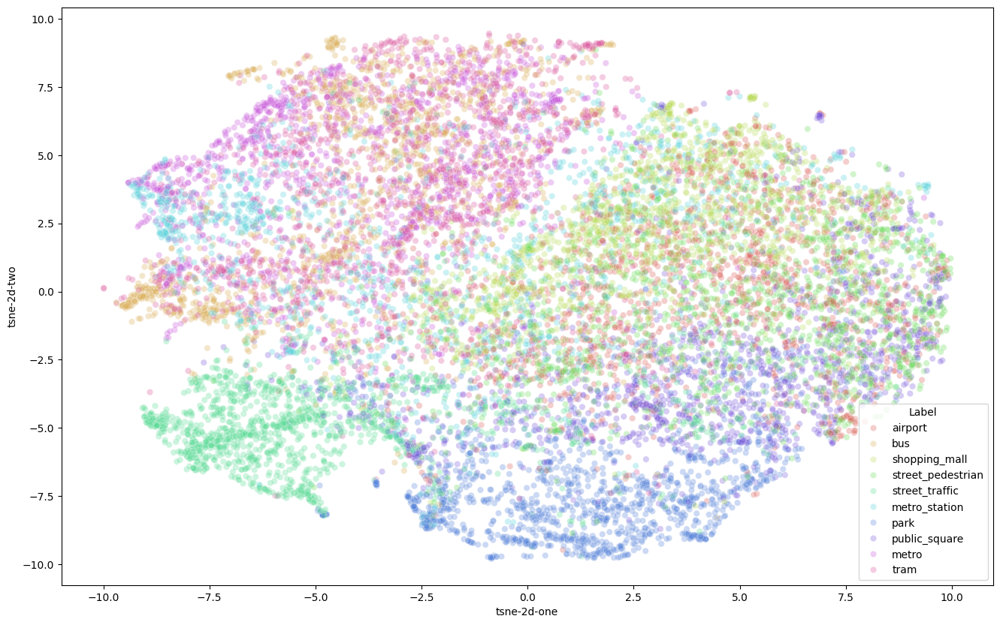

In [219]:
encoder_df_subset['tsne-2d-one'] = tsne_results[:,0]
encoder_df_subset['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="Label",
    palette=sns.color_palette("hls", 10),
    data=encoder_df_subset,
    legend="full",
    alpha=0.3
)

In [226]:
import time

time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300, random_state = 42)
tsne_results = tsne.fit_transform(embeddings_array)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 14400 samples in 0.006s...
[t-SNE] Computed neighbors for 14400 samples in 1.901s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14400
[t-SNE] Computed conditional probabilities for sample 2000 / 14400
[t-SNE] Computed conditional probabilities for sample 3000 / 14400
[t-SNE] Computed conditional probabilities for sample 4000 / 14400
[t-SNE] Computed conditional probabilities for sample 5000 / 14400
[t-SNE] Computed conditional probabilities for sample 6000 / 14400
[t-SNE] Computed conditional probabilities for sample 7000 / 14400
[t-SNE] Computed conditional probabilities for sample 8000 / 14400
[t-SNE] Computed conditional probabilities for sample 9000 / 14400
[t-SNE] Computed conditional probabilities for sample 10000 / 14400
[t-SNE] Computed conditional probabilities for sample 11000 / 14400
[t-SNE] Computed conditional probabilities for sample 12000 / 14400
[t-SNE] Computed conditional probabilities for sa

In [227]:
tsne_results.shape

(14400, 3)

In [228]:
encoder_df_subset.head()

,Audio_Name,Label,Encoder Output,Audio_Path,tsne-2d-one,tsne-2d-two
0,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,airport,"[979.00555, 1315.8931, 1674.273, 2150.1726, 97...",/work/aistwal/dataset_tau2019/extracted-files/...,8.552328,3.549558
1,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,bus,"[813.42163, 1309.7639, 1829.5267, 2345.505, 84...",/work/aistwal/dataset_tau2019/extracted-files/...,-5.957922,-0.663474
2,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,shopping_mall,"[1309.5095, 1663.2076, 2130.7615, 2628.9846, 1...",/work/aistwal/dataset_tau2019/extracted-files/...,4.018796,3.476418
3,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,street_pedestrian,"[1382.9443, 1703.7753, 2095.646, 2582.293, 143...",/work/aistwal/dataset_tau2019/extracted-files/...,2.515934,2.896080
4,/work/aistwal/MMDS_MasterThesis/data/tau2019/t...,street_pedestrian,"[1347.6736, 1669.3535, 2136.009, 2587.6548, 14...",/work/aistwal/dataset_tau2019/extracted-files/...,3.340628,1.242765


In [229]:
# Perform K-means clustering
kmeans = KMeans(n_clusters=10, random_state=42)
clusters = kmeans.fit_predict(tsne_results)

encoder_df_subset['tsne-3d-one'] = tsne_results[:,0]
encoder_df_subset['tsne-3d-two'] = tsne_results[:,1]
encoder_df_subset['tsne-3d-three'] = tsne_results[:,2]
encoder_df_subset['cluster'] = clusters

In [230]:
import plotly.express as px

# Create a 3D scatter plot using Plotly
fig = px.scatter_3d(
    encoder_df_subset,
    x='tsne-3d-one',
    y='tsne-3d-two',
    z='tsne-3d-three',
    color='Label',
    symbol='Label',# Ensure this column exists in your dataframe
    opacity=0.7  # Adjust opacity to ensure the plot is not too opaque
)

# Adjust layout for a tight fit in the output container
fig.update_layout(
    title='t-SNE Visualization of Embeddings with Labels',
    margin=dict(l=0, r=0, b=0, t=0),  # Minimize or remove margins
    width=1000,  # Set the desired width
    height=800  # Set the desired height
)

# Display the plot
fig.show()

In [231]:
# Create an interactive 3D scatter plot for clusters
cluster_colors = [
    '#1f77b4',  # A nice shade of blue
    '#ff7f0e',  # A vibrant orange
    '#2ca02c',  # A pleasant green
    '#d62728',  # A bold red
    '#9467bd',  # A muted purple
    '#8c564b',  # A brown color
    '#e377c2',  # A pinkish color
    '#7f7f7f',  # A gray color
    '#bcbd22',  # A yellow-green
    '#17becf'   # A cyan color
]
fig = go.Figure()

# Add clusters in 3D
for cluster in range(10):
    indices = np.where(clusters == cluster)[0]
    fig.add_trace(go.Scatter3d(
        x=encoder_df_subset['tsne-3d-one'].iloc[indices],
        y=encoder_df_subset['tsne-3d-two'].iloc[indices],
        z=encoder_df_subset['tsne-3d-three'].iloc[indices],
        mode='markers',
        marker=dict(color=cluster_colors[cluster], size=5),
        name=f'Cluster {cluster}'
    ))

# Update layout
fig.update_layout(
    title='t-SNE Visualization of Embeddings with Clusters (3D)',
    scene=dict(
        xaxis=dict(title='t-SNE Dimension 1'),
        yaxis=dict(title='t-SNE Dimension 2'),
        zaxis=dict(title='t-SNE Dimension 3')
    ),
    width=1000,  # Set the desired width
    height=800  # Set the desired height
)

# Show the interactive plot
fig.show()


In [232]:
encoder_df_subset['Label'].unique()

array(['airport', 'bus', 'shopping_mall', 'street_pedestrian',
       'street_traffic', 'metro_station', 'park', 'public_square',
       'metro', 'tram'], dtype=object)

In [233]:
class_colors = [
    '#aec7e8',  # Light Blue
    '#ffbb78',  # Light Orange
    '#98df8a',  # Light Green
    '#ff9896',  # Light Red
    '#c5b0d5',  # Light Purple
    '#c49c94',  # Light Brown
    '#f7b6d2',  # Light Pink
    '#c7c7c7',  # Light Gray
    '#dbdb8d',  # Light Yellow-Green
    '#9edae5',  # Light Cyan
]
# Assuming true labels are available in the DataFrame
# Map each label to a color
unique_labels = encoder_df_subset['Label'].unique()
label_colors = {label: class_colors[i] for i, label in enumerate(unique_labels)}

label_colors


{'airport': '#aec7e8',
 'bus': '#ffbb78',
 'shopping_mall': '#98df8a',
 'street_pedestrian': '#ff9896',
 'street_traffic': '#c5b0d5',
 'metro_station': '#c49c94',
 'park': '#f7b6d2',
 'public_square': '#c7c7c7',
 'metro': '#dbdb8d',
 'tram': '#9edae5'}

In [234]:
# Create an interactive 3D scatter plot for true labels
fig = go.Figure()

# Add data points corresponding to each true class label
for label in unique_labels:
    indices = encoder_df_subset[encoder_df_subset['Label'] == label].index
    fig.add_trace(go.Scatter3d(
        x=encoder_df_subset.loc[indices, 'tsne-3d-one'],
        y=encoder_df_subset.loc[indices, 'tsne-3d-two'],
        z=encoder_df_subset.loc[indices, 'tsne-3d-three'],
        mode='markers',
        marker=dict(color=label_colors[label], size=5),
        name=label
    ))

# Update layout
fig.update_layout(
    title='t-SNE Visualization of Embeddings with Clusters and True Labels (3D)',
    scene=dict(
        xaxis=dict(title='t-SNE Dimension 1'),
        yaxis=dict(title='t-SNE Dimension 2'),
        zaxis=dict(title='t-SNE Dimension 3')
    ),
    width=1000,  # Set the desired width
    height=800  # Set the desired height
)

# Show the interactive plot
fig.show()

In [238]:
#TRY PCA 50 REDUCTION AND THEN TSNE PLOTTING

from sklearn.decomposition import PCA

pca_50 = PCA(n_components=50)
pca_result_50 = pca_50.fit_transform(embeddings_array)

print('Cumulative explained variation for 50 principal components: {}'.format(np.sum(pca_50.explained_variance_ratio_)))

Cumulative explained variation for 50 principal components: 0.8743897676467896


In [239]:
time_start = time.time()

tsne = TSNE(n_components=3, verbose=0, perplexity=40, n_iter=300)
tsne_pca_results = tsne.fit_transform(pca_result_50)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 11.7969331741333 seconds


In [240]:
encoder_df_subset['tsne-pca50-one'] = tsne_pca_results[:,0]
encoder_df_subset['tsne-pca50-two'] = tsne_pca_results[:,1]
encoder_df_subset['tsne-pca50-three'] = tsne_pca_results[:,2]


# Create a 3D scatter plot using Plotly
fig = px.scatter_3d(
    encoder_df_subset,
    x='tsne-pca50-one',
    y='tsne-pca50-two',
    z='tsne-pca50-three',
    color='Label',
    symbol='Label',# Ensure this column exists in your dataframe
    opacity=0.7  # Adjust opacity to ensure the plot is not too opaque
)

# Adjust layout for a tight fit in the output container
fig.update_layout(
    title='PCA50 + t-SNE3 Visualization of Embeddings with Labels',
    margin=dict(l=0, r=0, b=0, t=0),  # Minimize or remove margins
    width=1000,  # Set the desired width
    height=800  # Set the desired height
)

# Display the plot
fig.show()